In [1]:
#Gerekli Kütüphaneler
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import itertools
from itertools import chain
from sklearn.feature_selection import RFE
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import VotingClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score, learning_curve, train_test_split
from sklearn.metrics import precision_score, recall_score, confusion_matrix, roc_curve, precision_recall_curve, accuracy_score
import warnings
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff
from matplotlib import animation
from matplotlib.patches import FancyArrowPatch
from sklearn.preprocessing import LabelEncoder

warnings.filterwarnings('ignore')

Veriseti olarak, Wisconsin Üniversitesi'nin 1995'te yayınladığı 569 hastanın verisini kullanacağız.
Veriseti, hastalara yapılan İğne Aspirasyon Biyopsisi sonuçlarından oluşup, hastadaki kistin türü (iyi huylu (begin) veya kötü huylu ( malign) ve hastadan alınan hücre örneğinden hesaplanmış aşağıdaki 10 kategorideki sayısal veriden oluşur

Yarıçap (radius mean)
Doku (texture )
Çevre(perimeter)
Alan(area)
Düzgünlük (smoothness )
Sıklık  (compactness (perimeter^2 / area - 1.0)) 
Dışbükeylik(concavity)
Dışbükey noktalar (dışbükey alanların hücre çeperine oranı(concave points))
Simetri(symmetry)
Fraktal boyutu(fractal dimension)
Veriseti aşağıda tablo olarak verilmiştir, isterseniz göz atabilirsiniz.

In [2]:
data = pd.read_csv('dataset1.csv')

In [3]:
#Daha iyi incelemek adına tüm datasetin sütun grafiğini oluşturyoruz
null_feat = pd.DataFrame(len(data['id']) - data.isnull().sum(), columns = ['Count'])

trace = go.Bar(x = null_feat.index, y = null_feat['Count'] ,opacity = 0.8, marker=dict(color = '#90c1d6',
        line=dict(color='#a3dfe3',width=1.5)))

layout = dict(title =  "Missing Values")

fig = dict(data = [trace], layout=layout)
py.iplot(fig)

In [4]:
#Unnamed: 32 coloumn Nan değeri olduğu için o sütunu siliyoruz.İleride sorun çıkartacaktır.
data = data.drop(['Unnamed: 32','id'],axis = 1)

#Hedef Atamaları yapılmıştır.M=1 B=0 Kötü huylu=1,iyi huylu=0
data.diagnosis.replace(to_replace = dict(M = 1, B = 0), inplace = True)

In [5]:
#Trace gor.Bar X eksenine length ile Toplam Tehşisi atıyoruz,Y eksenine ise M ve B yazdırıldı
M = data[(data['diagnosis'] != 0)]
B = data[(data['diagnosis'] == 0)]
trace = go.Bar(x = (len(M), len(B)), y = ['malignant', 'benign'], orientation = 'h', opacity = 1, marker=dict(
        color=[ '#9B59B6', '#F5B7B1'],
        line=dict(color='white',width=1.5)))
#Tehşis Sayısı
layout = dict(title =  'Count of diagnosis variable')
#
fig = dict(data = [trace], layout=layout)
py.iplot(fig)


In [6]:
#------------YÜZDELİK-------------------
#Pie metodu ile pasta grafiğine toplam tehşisin yüzelik dağılımını döküyoruz.
trace = go.Pie(labels = ['benign','malignant'], values = data['diagnosis'].value_counts(), 
               textfont=dict(size=15), opacity = 0.8,
               marker=dict(colors = ['pink', 'purple'], 
                           line=dict(color='white', width=1.5)))


layout = dict(title =  'Distribution of diagnosis variable')

fig = dict(data = [trace], layout=layout)
py.iplot(fig)

In [7]:
import plotly.express as px
from matplotlib import colors
import plotly.graph_objects as go
fig = px.histogram(data, x="radius_mean", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of radius_mean vs diagnosis", 
                   labels={"radius_mean": "radius_mean"},
                   template="plotly_white",
                   color_discrete_map={0:'pink',1:'purple'}
                  )
fig.show()
fig = px.histogram(data, x="texture_mean", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of radius_mean vs diagnosis", 
                   labels={"texture_mean": "texture_mean"},
                   template="plotly_white",
                   color_discrete_map={"0": "Pink", "1": "Purple"}
                  )
fig.show()
fig = px.histogram(data, x="perimeter_mean", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of perimeter_mean vs diagnosis", 
                   labels={"perimeter_mean": "perimeter_mean"},
                   template="plotly_white",
                   color_discrete_map={"0": "Pink", "1": "Purple"}
                  )
fig.show()
fig = px.histogram(data, x="area_mean", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of radius_mean vs diagnosis", 
                   labels={"area_mean": "area_mean"},
                   template="plotly_white",
                   color_discrete_map={"0": "Pink", "1": "MediumPurple"}
                  )
fig.show()
fig = px.histogram(data, x="smoothness_mean", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of smoothness_mean vs diagnosis", 
                   labels={"smoothness_mean": "smoothness_mean"},
                   template="plotly_white",
                   color_discrete_map={0:'pink',1:'purple'}
                  )
fig.show()
fig = px.histogram(data, x="compactness_mean", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of compactness_mean vs diagnosis", 
                   labels={"compactness_mean": "compactness_mean"},
                   template="plotly_white",
                   color_discrete_map={0:'pink',1:'purple'}
                  )
fig.show()

fig = px.histogram(data, x="concavity_mean", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of concavity_mean vs diagnosis", 
                   labels={"concavity_mean": "concavity_mean"},
                   template="plotly_white",
                   color_discrete_map={0:'pink',1:'purple'}
                  )
fig.show()
fig = px.histogram(data, x="concave points_mean", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of concave points_mean vs diagnosis", 
                   labels={"concave points_mean": "concave points_mean"},
                   template="plotly_white",
                   color_discrete_map={0:'pink',1:'purple'}
                  )
fig.show()
fig = px.histogram(data, x="symmetry_mean", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of symmetry_mean vs diagnosis", 
                   labels={"symmetry_mean": "symmetry_mean"},
                   template="plotly_white",
                   color_discrete_map={0:'pink',1:'purple'}
                  )
fig.show()
fig = px.histogram(data, x="fractal_dimension_mean", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of fractal_dimension_mean vs diagnosis", 
                   labels={"fractal_dimension_mean": "fractal_dimension_mean"},
                   template="plotly_white",
                   color_discrete_map={0:'pink',1:'purple'}
                  )
fig.show()



In [8]:
#Standart error sütunları için
import plotly.express as px
from matplotlib import colors
import plotly.graph_objects as go

fig = px.histogram(data, x="radius_se", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of radius_se vs diagnosis", 
                   labels={"radius_se": "radius_se"},
                   template="plotly_white",
                   color_discrete_map={0:'pink',1:'purple'}
                  )
fig.show()
fig = px.histogram(data, x="texture_se", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of texture_se vs diagnosis", 
                   labels={"texture_se": "texture_se"},
                   template="plotly_white",
                   color_discrete_map={0:'pink',1:'purple'}
                  )
fig.show()
fig = px.histogram(data, x="perimeter_se", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of perimeter_se vs diagnosis", 
                   labels={"perimeter_se": "perimeter_se"},
                   template="plotly_white",
                   color_discrete_map={0:'pink',1:'purple'}
                  )
fig.show()
fig = px.histogram(data, x="area_se", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of area_se vs diagnosis", 
                   labels={"area_se": "area_se"},
                   template="plotly_white",
                color_discrete_map={0:'pink',1:'purple'}
                  )
fig.show()
fig = px.histogram(data, x="smoothness_se", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of smoothness_se vs diagnosis", 
                   labels={"smoothness_se": "smoothness_se"},
                   template="plotly_white",
                  color_discrete_map={0:'pink',1:'purple'}
                  )
fig.show()
fig = px.histogram(data, x="compactness_se", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of compactness_se vs diagnosis", 
                   labels={"compactness_se": "compactness_se"},
                   template="plotly_white",
                   color_discrete_map={0:'pink',1:'purple'}
                  )
fig.show()

fig = px.histogram(data, x="concavity_se", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of concavity_se vs diagnosis", 
                   labels={"concavity_se": "concavity_se"},
                   template="plotly_white",
                 color_discrete_map={0:'pink',1:'purple'}
                  )
fig.show()
fig = px.histogram(data, x="concave points_se", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of concave points_se vs diagnosis", 
                   labels={"concave points_se": "concave points_se"},
                   template="plotly_white",
                 color_discrete_map={0:'pink',1:'purple'}
                  )
fig.show()
fig = px.histogram(data, x="symmetry_se", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of symmetry_se vs diagnosis", 
                   labels={"symmetry_se": "symmetry_se"},
                   template="plotly_white",
                   color_discrete_map={0:'pink',1:'purple'}
                  )
fig.show()
fig = px.histogram(data, x="fractal_dimension_se", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of fractal_dimension_se vs diagnosis", 
                   labels={"fractal_dimension_se": "fractal_dimension_se"},
                   template="plotly_white",
                   color_discrete_map={0:'pink',1:'purple'}
                  )
fig.show()



In [9]:
#Worst enkötü sütunlar için
import plotly.express as px
from matplotlib import colors
import plotly.graph_objects as go
fig = px.histogram(data, x="radius_worst", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of radius_worst vs diagnosis", 
                   labels={"radius_worst": "radius_worst"},
                   template="plotly_white",
                
                  color_discrete_map={0:'pink',1:'purple'}
                  )
fig.update_layout(barmode='stack')
fig.update_traces(opacity=0.75)

fig.show()
fig = px.histogram(data, x="texture_worst", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of texture_worst vs diagnosis", 
                   labels={"texture_worst": "texture_worst"},
                   template="plotly_white",
                   color_discrete_map={0:'pink',1:'purple'}
                  )
fig.show()
fig = px.histogram(data, x="perimeter_worst", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of perimeter_worst vs diagnosis", 
                   labels={"perimeter_worst": "perimeter_worst"},
                   template="plotly_white",
                  color_discrete_map={0:'pink',1:'purple'}
                  )
fig.show()
fig = px.histogram(data, x="area_worst", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of area_worst vs diagnosis", 
                   labels={"area_worst": "area_worst"},
                   template="plotly_white",
                   color_discrete_map={0:'pink',1:'purple'}
                  )
fig.show()
fig = px.histogram(data, x="smoothness_worst", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of smoothness_worst vs diagnosis", 
                   labels={"smoothness_worst": "smoothness_worst"},
                   template="plotly_white",
                  color_discrete_map={0:'pink',1:'purple'}
                  )
fig.show()
fig = px.histogram(data, x="compactness_worst", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of compactness_worst vs diagnosis", 
                   labels={"compactness_worst": "compactness_worst"},
                   template="plotly_white",
                   color_discrete_map={0:'pink',1:'purple'}
                  )
fig.show()

fig = px.histogram(data, x="concavity_worst", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of concavity_worst vs diagnosis", 
                   labels={"concavity_worst": "concavity_worst"},
                   template="plotly_white",
                   color_discrete_map={0:'pink',1:'purple'}
                  )
fig.show()
fig = px.histogram(data, x="concave points_worst", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of concave points_worst vs diagnosis", 
                   labels={"concave points_worst": "concave points_worst"},
                   template="plotly_white",
                   color_discrete_map={0:'pink',1:'purple'}
                  )
fig.show()
fig = px.histogram(data, x="symmetry_worst", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of symmetry_worst vs diagnosis", 
                   labels={"symmetry_worst": "symmetry_worst"},
                   template="plotly_white",
                   color_discrete_map={0:'pink',1:'purple'}
                  )
fig.show()
fig = px.histogram(data, x="fractal_dimension_worst", color="diagnosis", marginal="violin", hover_data=data.columns, 
                   title ="Distribution of fractal_dimension_worst vs diagnosis", 
                   labels={"fractal_dimension_worst": "fractal_dimension_worst"},
                   template="plotly_white",
                   color_discrete_map={0:'pink',1:'purple'}
                  )
fig.update_layout(barmode='stack')
fig.update_traces(opacity=0.70)

fig.show()



In [10]:
#corr(), veri çerçevesindeki tüm sütunların ikili korelasyonunu bulmak için kullanılır.
correlation = data.corr()
matrix_cols = correlation.columns.tolist()
#diziye çevirilmiştir
corr_array  = np.array(correlation)

In [11]:
#Korelasyon matrisinde ise 2’li vektör ilişkisi için matristeki hücreler -1 ile 1 arasında değer verilmektedir. 
#Bu değer 1’e yakınsa korelasyonuna bakılan 2 veri vektörü arasında güçlü bir doğru orantı, -1’ e yakınsa güçlü bir ters orantı vardır denilir. 
#Eğer korelasyon değeri 0’ a yakın ise veriler arasında  lineer bir ilişkiden söz edilemez.

In [12]:
trace = go.Heatmap(z = corr_array,
                   x = matrix_cols,
                   y = matrix_cols,
                   xgap = 2,
                   ygap = 2,
                   colorscale='Agsunset',
                   colorbar   = dict() ,
                  )
layout = go.Layout(dict(title = 'Correlation Matrix for variables',
                        autosize = False,
                        height  = 720,
                        width   = 800,
                        margin  = dict(r = 0 ,l = 210,
                                       t = 25,b = 210,
                                     ),
                        yaxis   = dict(tickfont = dict(size = 9)),
                        xaxis   = dict(tickfont = dict(size = 9)),
                       )
                  )
fig = go.Figure(data = [trace],layout = layout)
py.iplot(fig)

In [13]:
#Pozitif ilişkili değişkenler,özellikler
def plot_feat1_feat2(feat1, feat2) :  
    trace0 = go.Scatter(
        x = M[feat1],
        y = M[feat2],
        name = 'malignant',
        mode = 'markers', 
        marker = dict(color = 'purple',
            line = dict(
                width = 1)))

    trace1 = go.Scatter(
        x = B[feat1],
        y = B[feat2],
        name = 'benign',
        mode = 'markers',
        marker = dict(color = 'pink',
            line = dict(
                width = 1)))

    layout = dict(title = feat1 +" "+"vs"+" "+ feat2,
                  yaxis = dict(title = feat2,zeroline = False),
                  xaxis = dict(title = feat1, zeroline = False)
                 )

    plots = [trace0, trace1]

    fig = dict(data = plots, layout=layout)
    py.iplot(fig)

In [14]:
#Korelasyonun pozitif (+) olması durumunda değişkenler aynı yönde değişmiş demektir.
#Korelasyon katsayısının + olması iki değişkenin aynı yönde bir ilişkide olduğunu gösterir
plot_feat1_feat2('perimeter_mean','radius_worst')
plot_feat1_feat2('area_mean','radius_worst') 
plot_feat1_feat2('texture_mean','texture_worst')
plot_feat1_feat2('area_worst','radius_worst')
plot_feat1_feat2('perimeter_worst','radius_worst')
plot_feat1_feat2('perimeter_worst','perimeter_mean')
plot_feat1_feat2('area_mean','perimeter_mean')
plot_feat1_feat2('perimeter_worst','radius_mean')
plot_feat1_feat2('perimeter_worst','area_mean')


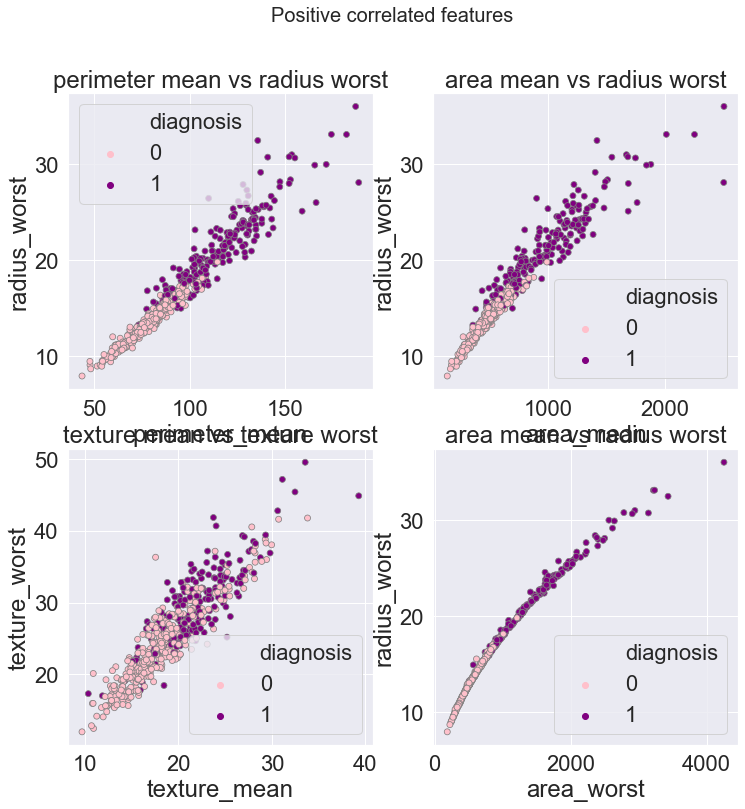

In [110]:
#seaborn version ile grafiğe dökme 

palette ={0 : 'pink', 1 : 'purple'}
edgecolor = 'grey'

# Plot +
fig = plt.figure(figsize=(12,12))

plt.subplot(221)
ax1 = sns.scatterplot(x = data['perimeter_mean'], y = data['radius_worst'], hue = "diagnosis",
                    data = data, palette = palette, edgecolor=edgecolor)
plt.title('perimeter mean vs radius worst')
plt.subplot(222)
ax2 = sns.scatterplot(x = data['area_mean'], y = data['radius_worst'], hue = "diagnosis",
                    data = data, palette =palette, edgecolor=edgecolor)
plt.title('area mean vs radius worst')
plt.subplot(223)
ax3 = sns.scatterplot(x = data['texture_mean'], y = data['texture_worst'], hue = "diagnosis",
                    data = data, palette =palette, edgecolor=edgecolor)
plt.title('texture mean vs texture worst')
plt.subplot(224)
ax4 = sns.scatterplot(x = data['area_worst'], y = data['radius_worst'], hue = "diagnosis",
                    data = data, palette =palette, edgecolor=edgecolor)
plt.title('area mean vs radius worst')

fig.suptitle('Positive correlated features', fontsize = 20)
plt.savefig('1')
plt.show()

In [16]:
#Eğer değişkenlerdeki artış veya azalış birbirine bağlı değilse korelasyon sıfır olur. 
#Bu da değişkenler arasında ilişki yok anlamına gelir.

plot_feat1_feat2('smoothness_mean','texture_mean')
plot_feat1_feat2('radius_mean','fractal_dimension_worst')
plot_feat1_feat2('texture_mean','symmetry_mean')
plot_feat1_feat2('texture_mean','symmetry_se')

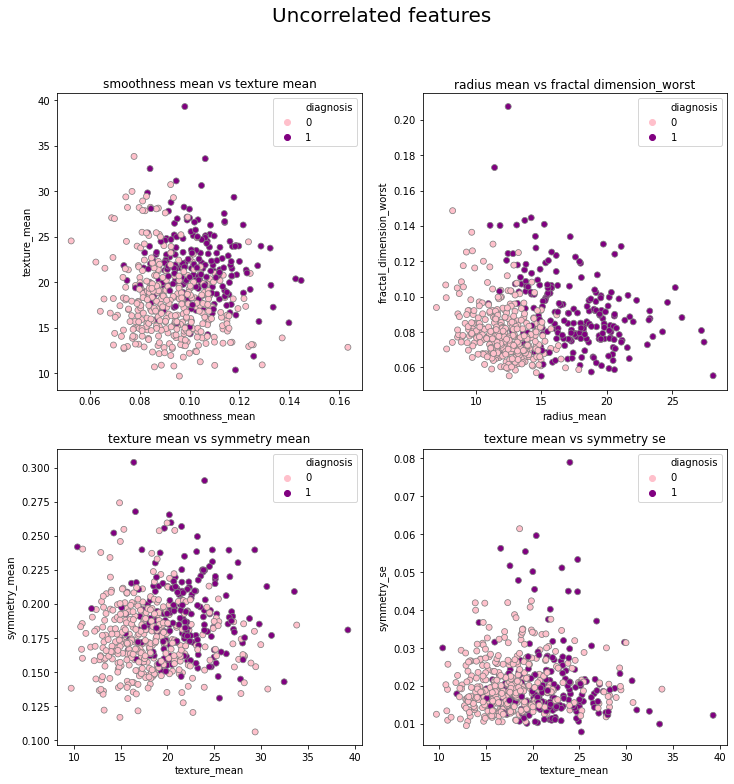

In [17]:
# seaborn version : 
fig = plt.figure(figsize=(12,12))

plt.subplot(221)
ax1 = sns.scatterplot(x = data['smoothness_mean'], y = data['texture_mean'], hue = "diagnosis",
                    data = data, palette =palette, edgecolor=edgecolor)
plt.title('smoothness mean vs texture mean')
plt.subplot(222)
ax2 = sns.scatterplot(x = data['radius_mean'], y = data['fractal_dimension_worst'], hue = "diagnosis",
                    data = data, palette =palette, edgecolor=edgecolor)
plt.title('radius mean vs fractal dimension_worst')
plt.subplot(223)
ax3 = sns.scatterplot(x = data['texture_mean'], y = data['symmetry_mean'], hue = "diagnosis",
                    data = data, palette =palette, edgecolor=edgecolor)
plt.title('texture mean vs symmetry mean')
plt.subplot(224)
ax4 = sns.scatterplot(x = data['texture_mean'], y = data['symmetry_se'], hue = "diagnosis",
                    data = data, palette =palette, edgecolor=edgecolor)
plt.title('texture mean vs symmetry se')

fig.suptitle('Uncorrelated features', fontsize = 20)
plt.savefig('2')
plt.show()

In [18]:
#Korelasyon katsayısının + olması iki değişkenin aynı yönde bir ilişkide olduğunu, 
#negatif (-) olması ise iki değişkenin arasında ters yönde bir ilişki olduğunu gösterir.  
plot_feat1_feat2('area_mean','fractal_dimension_mean')
plot_feat1_feat2('radius_mean','fractal_dimension_mean')
plot_feat1_feat2('area_mean','smoothness_se')
plot_feat1_feat2('smoothness_se','perimeter_mean')

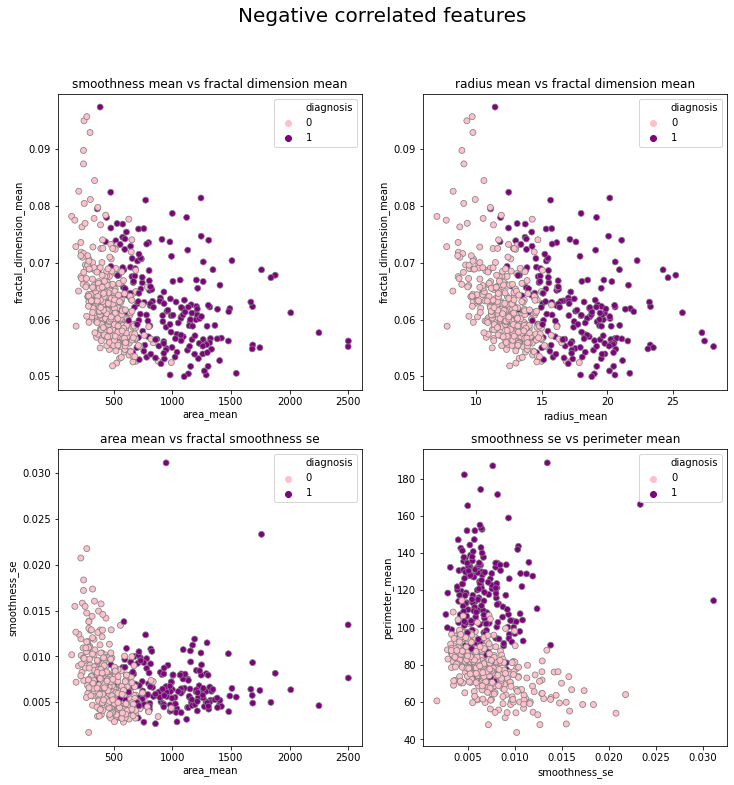

In [19]:
# seaborn version
fig = plt.figure(figsize=(12,12))

plt.subplot(221)
ax1 = sns.scatterplot(x = data['area_mean'], y = data['fractal_dimension_mean'], hue = "diagnosis",
                    data = data, palette =palette, edgecolor=edgecolor)
plt.title('smoothness mean vs fractal dimension mean')
plt.subplot(222)
ax2 = sns.scatterplot(x = data['radius_mean'], y = data['fractal_dimension_mean'], hue = "diagnosis",
                    data = data, palette =palette, edgecolor=edgecolor)
plt.title('radius mean vs fractal dimension mean')
plt.subplot(223)
ax2 = sns.scatterplot(x = data['area_mean'], y = data['smoothness_se'], hue = "diagnosis",
                    data = data, palette =palette, edgecolor=edgecolor)
plt.title('area mean vs fractal smoothness se')
plt.subplot(224)
ax2 = sns.scatterplot(x = data['smoothness_se'], y = data['perimeter_mean'], hue = "diagnosis",
                    data = data, palette =palette, edgecolor=edgecolor)
plt.title('smoothness se vs perimeter mean')

fig.suptitle('Negative correlated features', fontsize = 20)
plt.savefig('3')
plt.show()

Neden PCA? Modeldeki değişkenlerin sayısı nedeniyle, verilerdeki herhangi bir deseni ortaya çıkarmak için bir boyut azaltma tekniği kullanmayı deneyebiliriz. Keşfedici Veri Analizi bölümünde bahsedildiği gibi, birleştirildiğinde her hastanın teşhisini modellemek için kullanılabilecek otuz değişken vardır.
PCA'yı kullanarak birçok değişkenimizi, her biri modelin varyansının bir bölümünü açıklayan farklı doğrusal kombinasyonlarda birleştirebiliriz. PCA ile devam ederek, değişkenlerimizin kombinasyonlarının veri kümesindeki doğrusallığını varsayıyoruz. Yalnızca eş varyansın çoğunluğunu (> =% 85) sağlayan doğrusal kombinasyonları seçerek, modelimizin karmaşıklığını azaltabiliriz.
Bir PCA yapmanın ilk adımı, kendimize verinin birim varyansa ölçeklenip ölçeklenmeyeceğini sormaktır. Yani, tüm sayısal değişkenleri aynı ölçeğe getirmek. Başka bir deyişle, öz değerleri ve öz vektörler (diğer bir deyişle temel bileşenler) hesaplamalarımızda bir korelasyon matrisi mi yoksa bir kovaryans matrisi mi kullanmamız gerektiğini belirlemeye çalışıyoruz.

In [6]:
target_pca = data['diagnosis']
data_pca = data.drop('diagnosis', axis=1)

target_pca = pd.DataFrame(target_pca)

#To make a PCA, normalize data is essential
X_pca = data_pca.values
X_std = StandardScaler().fit_transform(X_pca)

pca = PCA(svd_solver='full')
pca_std = pca.fit(X_std, target_pca).transform(X_std)

pca_std = pd.DataFrame(pca_std)
pca_std = pca_std.merge(target_pca, left_index = True, right_index = True, how = 'left')
pca_std['diagnosis'] = pca_std['diagnosis'].replace({1:'malignant',0:'benign'})

In [7]:
#explained_variance 
var_pca = pd.DataFrame(pca.explained_variance_ratio_)
var_pca = var_pca.T

#----------SUM AND DROP COMP [7:30]
col_list = list(v for v in chain(pca_std.columns[6:30])) 
var_pca['OTHERS_COMP'] = var_pca[col_list].sum(axis=1)
var_pca.drop(var_pca[col_list],axis=1,inplace=True)
var_pca = var_pca.T

In [8]:
#Veri seti üzerinde yapmış olduğumuz PCA dönüşümü bize 6 bileşen seçmenin, verilerin toplam varyansının yaklaşık % 88.8 'sini koruyabileceğimizi söylemektedir. 

labels = ['COMP1','COMP2','COMP3','COMP4','COMP5','COMP6', 'COMP7 - 30']
colors = ['gold', 'lightgreen', 'lightcoral', 'lightskyblue', 'lightgrey', 'orange', 'white']

trace = go.Pie(labels = labels, values = var_pca[0].values, opacity = 0.8,
               textfont=dict(size=15),
               marker=dict(colors=colors, 
                           line=dict(color='#000000', width=1.5)))


layout = dict(title =  'PCA : components and explained variance (6 comp = 88.8%)')
 
                   
fig = dict(data = [trace], layout=layout)
py.iplot(fig)

In [9]:
#Veri seti üzerinde yapmış olduğumuz PCA dönüşümü bize 2 bileşen seçmenin, verilerin toplam varyansının yaklaşık % 63.3 'ünü koruyabileceğimizi söylemektedir. 

pca = PCA(n_components = 2)

pca_std = pca.fit(X_std, target_pca).transform(X_std)
pca_std = pd.DataFrame(pca_std,columns = ['COMP1','COMP2'])
pca_std = pca_std.merge(target_pca,left_index = True,right_index = True,how = 'left')
pca_std['diagnosis'] = pca_std['diagnosis'].replace({1:'malignant',0:'benign'})

def pca_scatter(target,color) :
    tracer = go.Scatter(x = pca_std[pca_std['diagnosis'] == target]['COMP1'] ,
                        y = pca_std[pca_std['diagnosis'] == target]['COMP2'],
                        name = target, mode = 'markers',
                        marker = dict(color = color,line = dict(width = 1))
                       )
    return tracer
layout = go.Layout(dict(title = 'PCA Scatter plot (2 comp = 63.3%)',
                        xaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     title = 'COMP1 = 44.3%',
                                     zerolinewidth=1,ticklen=5,gridwidth=2),
                        yaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     title = 'COMP2 = 19.0%',
                                     zerolinewidth=1,ticklen=5,gridwidth=2),
                        height = 800
                       ))
trace1 = pca_scatter('malignant','#FFD700')
trace2 = pca_scatter('benign','#7EC0EE')
plots = [trace2,trace1]
fig = go.Figure(data = plots,layout = layout)
py.iplot(fig)


In [10]:
pca = PCA(n_components = 3)
pca_std = pca.fit(X_std, target_pca).transform(X_std)

pca_std = pd.DataFrame(pca_std,columns = ['COMP1','COMP2','COMP3'])
pca_std = pca_std.merge(target_pca, left_index = True, right_index = True,how = 'left')
pca_std['diagnosis'] = pca_std['diagnosis'].replace({1:'malignant',0:'benign'})

#Veri seti üzerinde yapmış olduğumuz PCA dönüşümü bize 3 bileşen seçmenin, verilerin toplam varyansının yaklaşık % 72.7 'ünü koruyabileceğimizi söylemektedir. 
M_pca = pca_std[(pca_std['diagnosis'] == 'malignant')]
B_pca = pca_std[(pca_std['diagnosis'] == 'benign')]
trace1 = go.Scatter3d(x = M_pca['COMP1'],
                      y = M_pca['COMP3'],
                      z = M_pca['COMP2'],
                      mode = "markers",
                      name = "malignant",
                      marker = dict(size = 4,color = '#FFD700',line = dict(width = 1))
                     )
trace2 = go.Scatter3d(x = B_pca['COMP1'],
                      y = B_pca['COMP3'],
                      z = B_pca['COMP2'],
                      name = 'benign',
                      mode = 'markers',
                      marker = dict(size = 4,color= '#7EC0EE',line = dict(width = 1))
                     )



layout = go.Layout(dict(title = 'PCA Scatter plot (3 comp = 72.7%)',
                        scene = dict(camera = dict(up=dict(x= 0 , y=0, z=0),
                                                   center=dict(x=0, y=0, z=0),
                                                   eye=dict(x=1.25, y=1.25, z=1.25)),
                                     xaxis  = dict(title = 'COMP1',
                                                   gridcolor='rgb(255, 255, 255)',
                                                   zerolinecolor='rgb(255, 255, 255)',
                                                   showbackground=True,
                                                   backgroundcolor='rgb(230, 230,230)'),
                                     yaxis  = dict(title = 'COMP3',
                                                   gridcolor='rgb(255, 255, 255)',
                                                   zerolinecolor='rgb(255, 255, 255)',
                                                   showbackground=True,
                                                   backgroundcolor='rgb(230, 230,230)'
                                                  ),
                                     zaxis  = dict(title = 'COMP2',
                                                   gridcolor='rgb(255, 255, 255)',
                                                   zerolinecolor='rgb(255, 255, 255)',
                                                   showbackground=True,
                                                   backgroundcolor='rgb(230, 230,230)'
                                                  )),height = 700))
                  

plots = [trace1,trace2]
fig  = go.Figure(data = plots,layout = layout)
py.iplot(fig)

In [15]:
#Her Ml alogritması için gerekli kütüphaneler satırlarda import edilcektir.
## SVC sınıfını import ettik
from sklearn.svm import SVC
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, confusion_matrix, roc_curve, precision_recall_curve, accuracy_score
from sklearn import preprocessing
from sklearn.model_selection import cross_val_score,learning_curve, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [16]:
sns.set(style = 'darkgrid')
%matplotlib inline

In [17]:
# X'e features , Y'ise diagnosis kolonlarının değerlerini bir değişkene atadık
X = data.iloc[:,1:].values
y = data['diagnosis'].values
#X,y = np.array(data.iloc[:,1:].values),np.array(data.iloc[:,0].values)

In [18]:
print(f"'X' shape: {X.shape}")
print(f"'y' shape: {y.shape}")

'X' shape: (569, 30)
'y' shape: (569,)


In [19]:
#Scikit-learn nesnesi MinMaxScaler'ı kullanarak veri kümenizi normalize edebilir, ölçekleme  yapabiliriz .
#Scikit-learn nesnesi StandardScaler'ı kullanarak veri kümenizi standartlaştırabilirsiniz .
pipeline = Pipeline([
    ('min_max_scaler', MinMaxScaler()),
    ('std_scaler', StandardScaler())
])
# Veri kümemizi test ve train şekinde bölüyoruz
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=22,stratify=y)


In [20]:
#ÖZELLİK ÖLÇEKLENDİRME
#Destek Vektör Makinesi (SVM) optimizasyonu, w karar vektörü en aza indirilerek gerçekleştiğinden, optimum hiper düzlem, girdi özelliklerinin ölçeğinden etkilenir ve bu nedenle, SVM model eğitiminden önce verilerin standartlaştırılması  önerilir.
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test= scaler.transform(X_test)

Text(0.5, 1.0, 'Support Vector Classifier scores for different kernels')

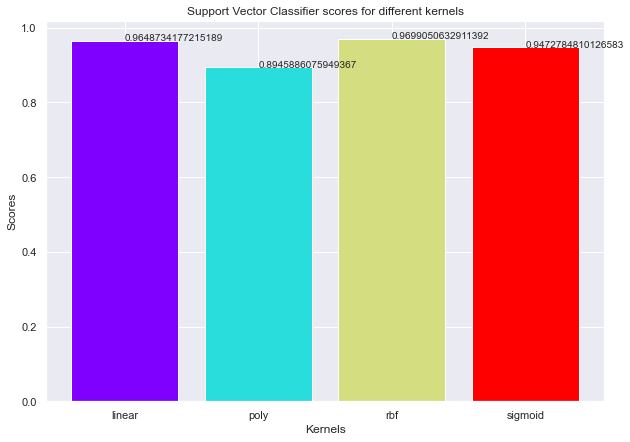

In [21]:
# SVC sınıfından bir nesne ürettik
# Parametre olarak farklı kernel trick tipleri verilebilir.
# Başarı oranının değiştiği gözlemlenecektir. ( ‘linear’, ‘poly’, ‘rbf’)
from sklearn.pipeline import make_pipeline
from sklearn.svm import SVC
svc_scores = []
kernels = ['linear', 'poly', 'rbf', 'sigmoid']
for i in range(len(kernels)):
    svc_classifier = SVC(kernel = kernels[i])
    pipe = make_pipeline(scaler,svc_classifier)
    svc_scores.append(cross_val_score(pipe, X_train, y_train, cv=5, scoring='accuracy').mean())
from matplotlib.cm import rainbow
import numpy as np
colors = rainbow(np.linspace(0, 1, len(kernels)))
plt.figure(figsize=(10,7))
plt.bar(kernels, svc_scores, color = colors)
for i in range(len(kernels)):
    plt.text(i, svc_scores[i], svc_scores[i])
plt.xlabel('Kernels')
plt.ylabel('Scores')
plt.title('Support Vector Classifier scores for different kernels')

In [22]:
print('Accuracy score on Train data: {}'.format(svc_scores[2]*100))
from sklearn import metrics
svc_classifier = SVC(kernel = 'rbf')
pipe = make_pipeline(scaler,svc_classifier)
pipe.fit(X_train, y_train)
y_pred = pipe.predict(X_test)
print('Accuracy score on Test data: {}'.format(metrics.accuracy_score(y_test,y_pred)*100))

Accuracy score on Train data: 96.99050632911393
Accuracy score on Test data: 97.6608187134503


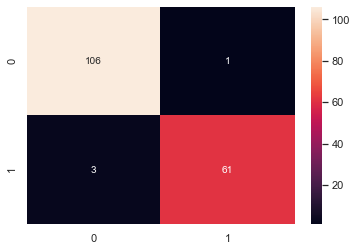

In [23]:
sns.heatmap(confusion_matrix(y_test,y_pred), annot=True, fmt="d")

In [24]:
#Verileri normalleştirme
#Verileri, her grup bütünün küçük bir bölümünü tanımlayacak şekilde mantıksal gruplar halinde düzenleyin. 
#Bir veritabanında depolanan yinelenen verilerin miktarını en aza indirin.
norm_data = (X - np.min(X)) / (np.max(X) - np.min(X))    

In [25]:
norm_data.shape

(569, 30)

In [26]:
#Train = 80%     Test = 20%
#from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(norm_data, y, test_size=0.2, random_state=102) #0.20 4
# 2 y değişkeni sen malmısın
print("x train: ",X_train.shape)
print("x test: ",X_test.shape)
print("y train: ",y_train.shape)
print("y test: ",y_test.shape)

x train:  (455, 30)
x test:  (114, 30)
y train:  (455,)
y test:  (114,)


In [27]:
#Lojistik Regression uyguladık
from sklearn.linear_model import LogisticRegression
##Model Oluşturdum
lr = LogisticRegression(random_state=102,solver='lbfgs') 
# Eğitim modeli
lr.fit(X_train, y_train)
# Önemli metrikleri yakalayacağız
print(lr.classes_)
#print('Karar fonksiyonundaki özelliklerin katsayısı: ', lr.coef_)

[0 1]


In [28]:
#X_Test Seti ile Tahmin Yapmak
## Sadece y_pred'den oluşan df'e test(gerçek) y_test'i sütun olarak ekledim
predictions = lr.predict(X_test)
#Skor yazdırma
from sklearn.metrics import accuracy_score, roc_auc_score
accuracy_score = accuracy_score(predictions, y_test)
auc = roc_auc_score(y_test, predictions)
print('Lojistik Regression accuracy_score: {}  %'.format(accuracy_score*100))
#print('auc: {}  %'.format(auc*100))

Lojistik Regression accuracy_score: 91.22807017543859  %


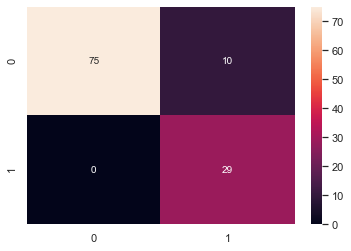

In [29]:
sns.heatmap(confusion_matrix(predictions, y_test), annot=True, fmt="d")

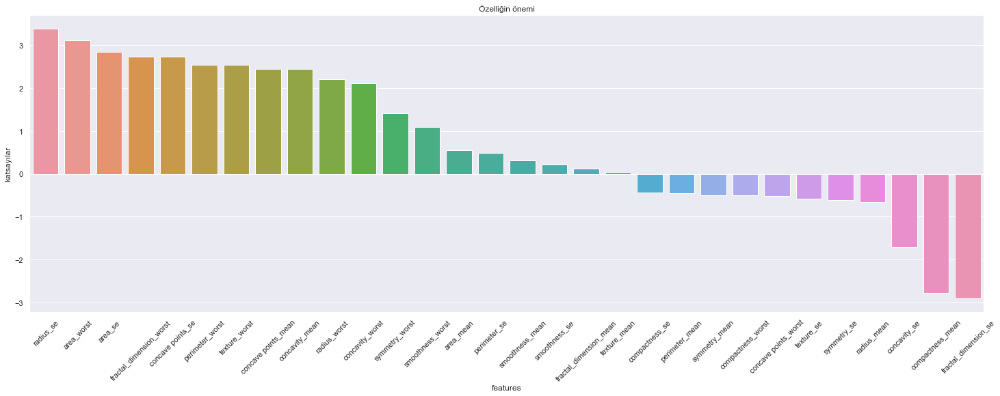

In [30]:
from matplotlib import pyplot as plt
Cs = np.logspace(-1, 8, 5)
lr_pipe = Pipeline([('scaler', StandardScaler()), ('lr', LogisticRegression(random_state=17,solver='lbfgs'))])
lr_params = {'lr__C': Cs}
lr_pipe_grid = GridSearchCV(lr_pipe, lr_params, cv=10, scoring='recall')
lr_pipe_grid.fit(X_train, y_train)
lr_best_pipe = lr_pipe_grid.best_estimator_.named_steps['lr']
## Regresyon katsayılarının Dataframe oluşturun
#özniteliklere karşılık gelen katsayıları alır=coef
coef= pd.DataFrame(lr_best_pipe.coef_.ravel())
#Regresyon katsayılayırını özellik isimleri ile eşleştiririz/birleştiririz
df_columns = pd.DataFrame(data.drop(['diagnosis'], axis=1).columns)
coef_and_feat = pd.merge(coef,df_columns,left_index= True,right_index= True, how = "left")
coef_and_feat.columns = ["katsayılar","features"]
coef_and_feat = coef_and_feat.sort_values(by = "katsayılar",ascending = False)

#Matplotlib figürünü oluşturduk en-boy verilmiştir.
plt.rcParams['figure.figsize'] = (25,8)
# 10 tane önemli özelliğin grafiğini yazırıyoruz
sns.barplot(x = 'features', y = 'katsayılar', data = coef_and_feat).set_title('Özelliğin önemi')
plt.xticks(rotation=45);

In [31]:
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn import preprocessing

In [32]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
#ann modeli oluşturulmuştur.
#Keras iki modele sahiptir Sequential= doğrusal bir katman yığını(a linear stack of layers), ve Graf=katmanların yönlendirilmiş döngüsel olmayan grafiği.
#Sequential modeli kullandık
model = Sequential()
model.add(Dense(12, input_dim=30, activation='relu'))
model.add(Dense(8, activation='relu'))
model.add(Dense(1, activation='sigmoid'))
#keras modelini çalıştırdık/derledik.
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
#keras modelini veri kümesine ayarladık
#train modülü için 3=devir,16 (örnek)grubu (3 epochs,batches of 16 samples) ile X_train dizisinde depolanan verilerde,y_train dizisinde depolanan etiketler
model.fit(X_train,y_train, epochs=150, batch_size=10, verbose=0)
#Başarı oranı yazdırıyoruz
predictions = model.predict_classes(X_test)
accuracy=accuracy_score(y_test, predictions)
print('ANN with keras Accuracy: %.2f' % (accuracy*100))
# summarize the first 5 cases
#for i in range(5):
    #print('%s => %d (expected %d)' % (X[i].tolist(), predictions[i], y[i]))

ANN with keras Accuracy: 94.74


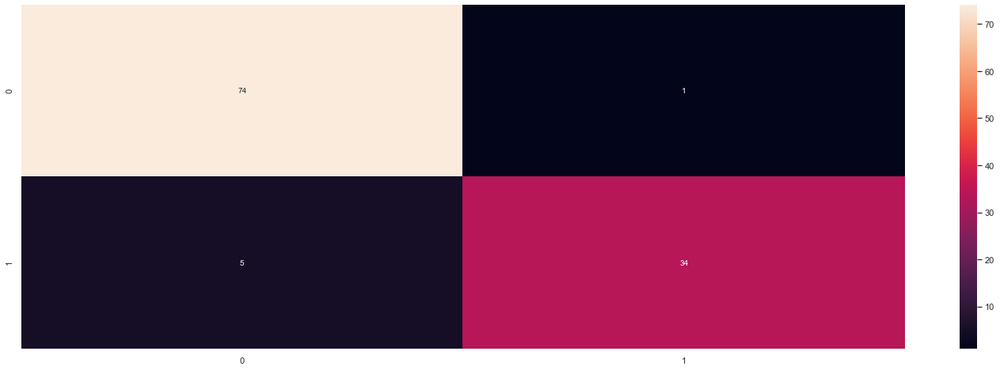

In [33]:
sns.heatmap(confusion_matrix(y_test,predictions), annot=True, fmt="d")

In [34]:
#Neural Networks(Multi Layer Perceptron)
from sklearn.neural_network import MLPClassifier

#Model oluşturlmuştur ve parametreler dahil edilmiştir.
model = MLPClassifier(hidden_layer_sizes = (200, 200), max_iter = 200)

# feeding the training set into the model
model.fit(X_train, y_train)

# X_test için tahmin
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: %.2f" % (accuracy * 100.0))

# Doğruluk hesaplanmıştır.
#print("Training accuracy :", model.score(X_train, y_train))
#print("Testing accuarcy :", model.score(X_test, y_test))


Accuracy: 95.61


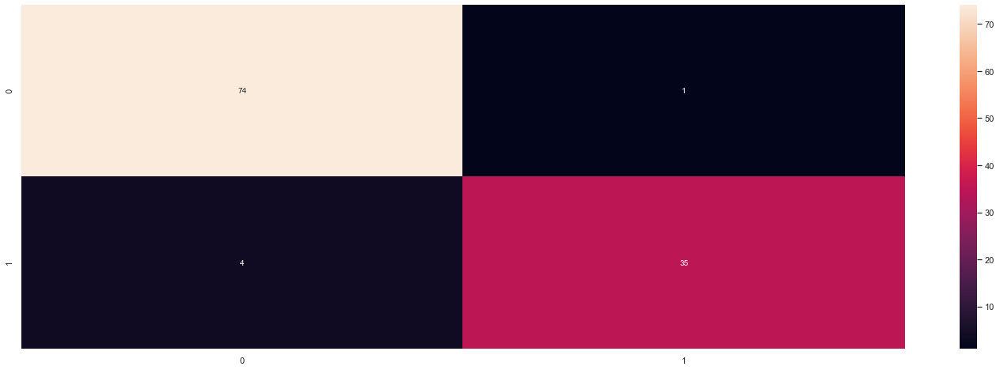

In [35]:
sns.heatmap(confusion_matrix(y_test,y_pred), annot=True, fmt="d")

In [36]:
from sklearn.naive_bayes import GaussianNB
from sklearn import metrics
from sklearn.metrics import accuracy_score
#from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(norm_data, y, test_size=0.2, random_state=102) #0.20 4
nb = GaussianNB()
nb.fit(X_train, y_train)
predictions_nb = nb.predict(X_test)
accuracy_nb=accuracy_score(predictions_nb,y_test)
print("Accuracy: % {:10.2f}".format(accuracy_nb*100)) 
#print('Accuracy: %.2f' % (accuracy*100))
#print("Naive Bayes accuracy : {:.2f}%".format(nb.score(X_test, y_test)*100))

Accuracy: %      97.37


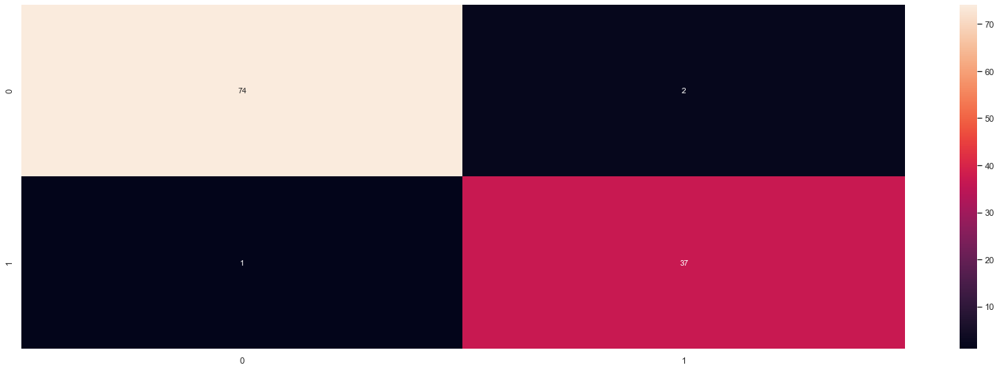

In [37]:
sns.heatmap(confusion_matrix(predictions_nb,y_test), annot=True, fmt="d")

# """Random Forest
Random Forest, özellikler ve sonuç arasındaki ilişkinin doğrusal olmadığı veya özelliklerin birbiriyle etkileştiği durumlarda 
sınıflandırma ve regresyon için kullanılabilen en basit algoritmalardan biridir. Genel olarak karar ağaçları genellikle 
ölçeklendirme gerektirmez. Python'daki GridSearchCV işlevinin yardımıyla, bir parametre ızgarası üzerinde çapraz doğrulanmış
ızgara aramasıyla model optimal parametreleri kapsamlı bir şekilde araştıran ağacın derinliği, bölünmüş kriterler, bir yaprak
düğümü için minimum örnek sayısı gibi en iyi parametreler , tanımlanabilir:"""

In [38]:
# Hyper Parametre Ayarı Olmadan
#Random Forest modülünü import ediyoruz
from sklearn.ensemble import RandomForestClassifier 
#instance(örnek) oluşturduk
rf=RandomForestClassifier(criterion = 'entropy',random_state=0,max_depth=2)
#modeli eğit
rf.fit(X_train,y_train)
#Tahmin yazdır Test&Train
print('Random Forest Train Score :',rf.score(X_train,y_train))
print('Random Forest Test Score :',rf.score(X_test,y_test))
y_pred_rf=rf.predict(X_test)
#metrics modülünü import etme
from sklearn.metrics import accuracy_score
#Değerlendirme(Doğruluk)
accuracy_s=accuracy_score(y_test,y_pred_rf)
print('Accuracy Score',accuracy_s)

Random Forest Train Score : 0.9560439560439561
Random Forest Test Score : 0.9736842105263158
Accuracy Score 0.9736842105263158


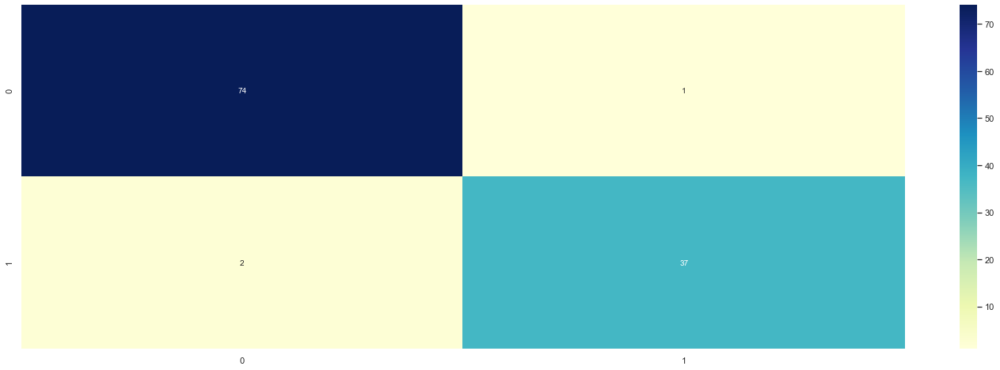

In [39]:
sns.heatmap(confusion_matrix(y_test,y_pred_rf),cmap="YlGnBu",annot=True, fmt="d")

rf_fpr Value  :  [0.         0.01333333 1.        ]
rf_tpr Value  :  [0.         0.94871795 1.        ]
thresholds Value  :  [2 1 0]


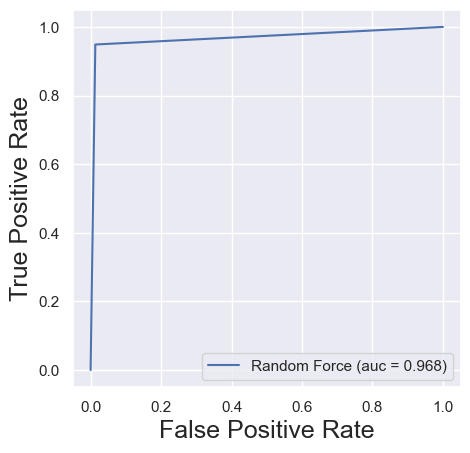

In [40]:
from sklearn.metrics import roc_curve,auc
rf_tpr,rf_fpr,threshold=roc_curve(y_test,y_pred_rf)
rf_auc=auc(rf_tpr,rf_fpr)
print('rf_fpr Value  : ', rf_tpr)
print('rf_tpr Value  : ', rf_fpr)
print('thresholds Value  : ', threshold)

#Draw ROC Curve && AUC [Area Under The Curve]

plt.figure(figsize=(5, 5), dpi=100)
plt.plot(rf_tpr, rf_fpr, linestyle='-', label='Random Force (auc = %0.3f)' % rf_auc)

plt.ylabel('True Positive Rate', fontsize = 18)
plt.xlabel('False Positive Rate', fontsize = 18)

plt.legend()
plt.show()

Benim bu düzlemde bakmam gereken ana metrik aslında bu ROC eğrilerinin altında kalan alandır(AUC-Area Under The Curve). Bu alan 1’e yaklaştıkça iyi huylu ile kötü huylu ayırt etmek için kurduğum sınıflandırma modelinin başarımı artıyor demektir.

In [41]:
from sklearn.tree import DecisionTreeClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)

#making the instance
model= DecisionTreeClassifier(criterion = 'entropy',random_state=1234)
#learning
model.fit(X_train,y_train)
#Prediction
prediction=model.predict(X_test)
#importing the metrics module
from sklearn import metrics
#evaluation(Accuracy)
print("Accuracy:",metrics.accuracy_score(prediction,y_test))
#print("Confusion Metrix:\n",metrics.confusion_matrix(prediction,y_test))

Accuracy: 0.9736842105263158


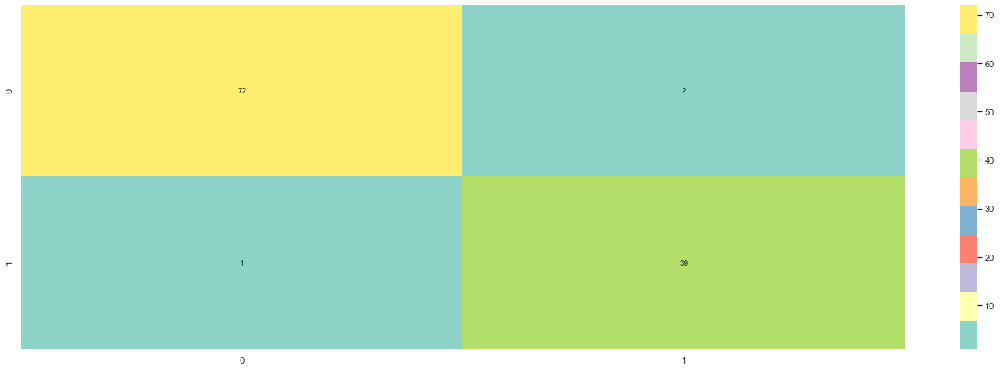

In [42]:
sns.heatmap(confusion_matrix(prediction,y_test),annot=True,fmt='g',cmap='Set3')

In [43]:
from sklearn.neighbors import KNeighborsClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=40)
knn = KNeighborsClassifier(n_neighbors = 5,)
knn.fit(X_train,y_train)
y_pred = knn.predict(X_test)
accuracy = accuracy_score(y_test,y_pred)
score = knn.score(X_test,y_test)
print("Score",score)
#print("CM",cm)
print("KNN acc",accuracy)

Score 0.9385964912280702
KNN acc 0.9385964912280702


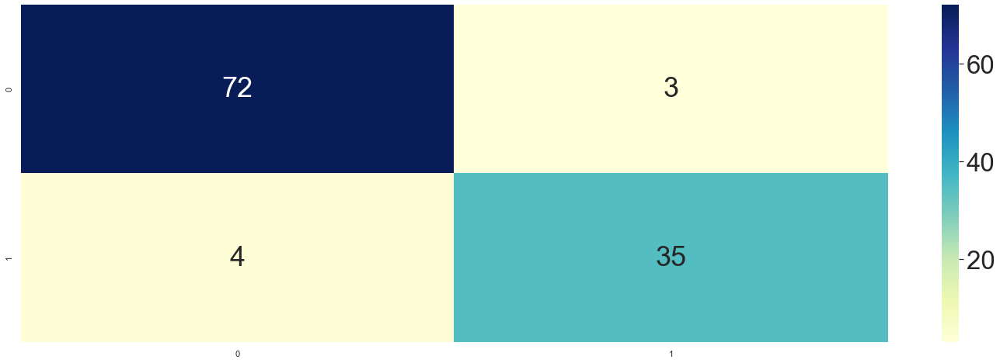

In [44]:
ax = plt.subplot()
sns.set(font_scale=3.0) # Adjust to fit
sns.heatmap(confusion_matrix(y_test,y_pred),cmap="YlGnBu", annot=True, ax=ax, fmt="g");

The optimal number of neighbors is  11 


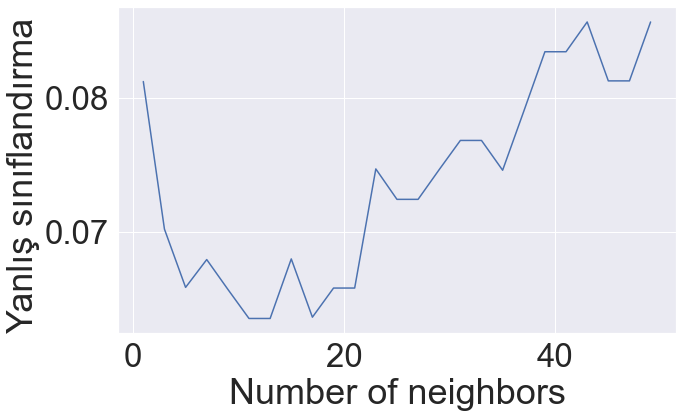

In [45]:
neighbors = [] 
cv_scores = [] 

#from sklearn.model_selection import cross_val_score 
# 10 kat çapraz doğrulama gerçekleştirin 
for k in range(1, 51, 2): 
	neighbors.append(k) 
	knn = KNeighborsClassifier(n_neighbors = k) 
	scores = cross_val_score( 
		knn, X_train, y_train, cv = 10, scoring = 'accuracy') 
	cv_scores.append(scores.mean()) 
	MSE = [1-x for x in cv_scores] 

# en iyi k'yi belirleme
optimal_k = neighbors[MSE.index(min(MSE))] 
print('The optimal number of neighbors is % d ' % optimal_k) 

# plot yanlış sınıflandırma hatası ile k
plt.figure(figsize = (10, 6)) 
plt.plot(neighbors, MSE) 
plt.xlabel('Number of neighbors') 
plt.ylabel('Yanlış sınıflandırma ') 
plt.show() 



In [46]:
#Haydi test edelim 
for i in range(1, 20):
    knn = KNeighborsClassifier(n_neighbors = i)
    knn.fit(X_train, y_train)
    score = knn.score(X_train, y_train)
    print("N = " + str(i) + " :: Score = " + str(score))
    

N = 1 :: Score = 1.0
N = 2 :: Score = 0.9428571428571428
N = 3 :: Score = 0.9560439560439561
N = 4 :: Score = 0.9428571428571428
N = 5 :: Score = 0.9428571428571428
N = 6 :: Score = 0.9472527472527472
N = 7 :: Score = 0.9428571428571428
N = 8 :: Score = 0.9428571428571428
N = 9 :: Score = 0.9406593406593406
N = 10 :: Score = 0.9384615384615385
N = 11 :: Score = 0.9384615384615385
N = 12 :: Score = 0.9362637362637363
N = 13 :: Score = 0.9340659340659341
N = 14 :: Score = 0.9362637362637363
N = 15 :: Score = 0.9362637362637363
N = 16 :: Score = 0.9362637362637363
N = 17 :: Score = 0.9362637362637363
N = 18 :: Score = 0.9384615384615385
N = 19 :: Score = 0.9406593406593406


In [47]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.metrics import roc_auc_score
from sklearn import metrics

lda = LDA()
lda.fit(X_train, y_train)
score = lda.score(X_test, y_test)
predections = lda.predict(X_test)
prob=lda.predict_proba(X_test)
auc = roc_auc_score(y_test, predections)

# fpr, tpr, thresholds = metrics.roc_curve(y_test, prob[:,1])
# plt.plot(fpr, tpr)
# # plt.show()
# # print ("AUC: ",auc)
print( "Accuracy= ",(score))


Accuracy=  0.9649122807017544


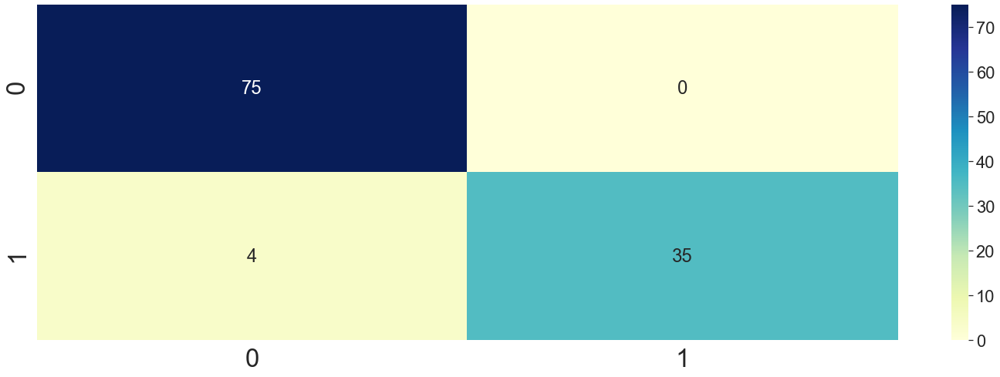

In [48]:
ax = plt.subplot()
sns.set(font_scale=2.0) # Adjust to fit
sns.heatmap(confusion_matrix(y_test,predections),cmap="YlGnBu", annot=True, ax=ax, fmt="g");

In [42]:
#Xboost için gerekli yüklemeler gerçekleştirildi.
conda install -c conda-forge xgboost
 pip install xgboost


In [43]:
#pip install mglearn

In [44]:
conda install -c conda-forge xgboost


Solving environment: ...working... done

## Package Plan ##

  environment location: C:\Users\irem\anaconda3

  added / updated specs:
    - xgboost


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    ca-certificates-2021.5.30  |       h5b45459_0         171 KB  conda-forge
    scikit-learn-0.24.2        |   py38hf11a4ad_1         4.8 MB
    ------------------------------------------------------------
                                           Total:         5.0 MB

The following NEW packages will be INSTALLED:

  _anaconda_depends  pkgs/main/win-64::_anaconda_depends-2020.07-py38_0
  _py-xgboost-mutex  conda-forge/win-64::_py-xgboost-mutex-2.0-cpu_0
  libxgboost         conda-forge/win-64::libxgboost-1.4.0-h0e60522_0
  numpy-base         pkgs/main/win-64::numpy-base-1.18.5-py38hc3f5095_0
  py-xgboost         conda-forge/win-64::py-xgboost-1.4.0-py38haa244fe_0
  scikit-learn       pkgs/mai


The environment is inconsistent, please check the package plan carefully
The following packages are causing the inconsistency:

  - defaults/noarch::alabaster==0.7.12=py_0
  - defaults/win-64::anaconda==2020.07=py38_0
  - defaults/win-64::anaconda-client==1.7.2=py38_0
  - defaults/win-64::anaconda-navigator==1.9.12=py38_0
  - defaults/noarch::anaconda-project==0.8.4=py_0
  - defaults/win-64::argh==0.26.2=py38_0
  - defaults/win-64::asn1crypto==1.3.0=py38_0
  - defaults/win-64::astroid==2.4.2=py38_0
  - defaults/win-64::astropy==4.0.1.post1=py38he774522_1
  - defaults/noarch::atomicwrites==1.4.0=py_0
  - defaults/noarch::attrs==19.3.0=py_0
  - defaults/noarch::autopep8==1.5.3=py_0
  - defaults/noarch::babel==2.8.0=py_0
  - defaults/noarch::backcall==0.2.0=py_0
  - defaults/noarch::backports==1.0=py_2
  - defaults/noarch::backports.functools_lru_cache==1.6.1=py_0
  - defaults/win-64::backports.shutil_get_terminal_size==1.0.0=py38_2
  - defaults/noarch::backports.tempfile==1.0=py_1
  - d

In [45]:
 pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [49]:
import xgboost
xg = xgboost.XGBClassifier(max_depth=3, n_estimators=400, learning_rate=0.05)
xg.fit(X_train, y_train)
y_pred_xg = xg.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_xg)
print("Accuracy: %.2f" % (accuracy * 100.0))
#print("XGboost accuracy : {:.2f}%".format(xg.score(X_test, y_test)*100))

[11:38:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy: 93.86


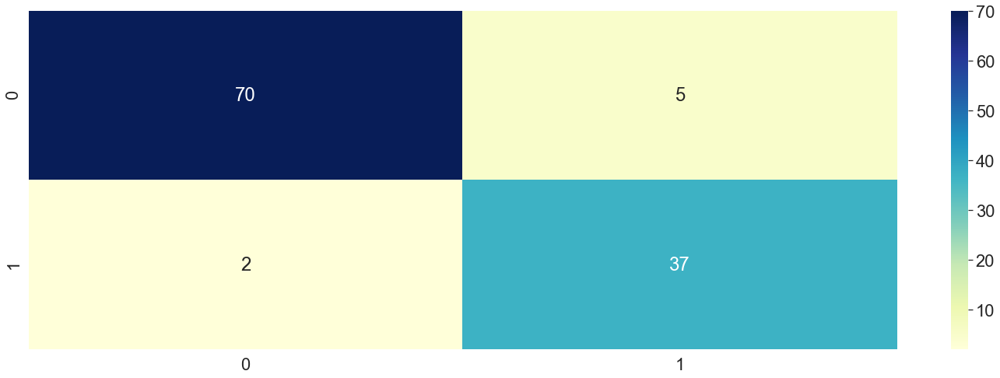

In [50]:
ax = plt.subplot()
sns.set(font_scale=2.0) # Adjust to fit
sns.heatmap(confusion_matrix(y_test,y_pred_xg),cmap="YlGnBu", annot=True, ax=ax, fmt="g");

In [51]:
from sklearn.ensemble import AdaBoostClassifier
from scipy.stats import randint as sp_randint
from sklearn.model_selection import RandomizedSearchCV
# sample boyutuna bağlı olarak karar kütüklerinin kullanılması.
# Fazla oturmayı önlemeye çalışma
## AdaBoosted bir karar ağacı oluşturun ve uydurun
stump_clf =  DecisionTreeClassifier(random_state=42, max_depth=1)

param_grid = {
             "base_estimator__max_features": ['auto', 'sqrt', 'log2'],
             "n_estimators": list(range(1,500)),
             "learning_rate": np.linspace(0.01, 1, num=20),
            }
ada_clf = AdaBoostClassifier(base_estimator = stump_clf)

rand_ada = RandomizedSearchCV(ada_clf, param_grid, scoring = 'accuracy', n_iter=100, random_state=42)
rand_ada.fit(X,y)
print(rand_ada.best_score_)
print(rand_ada.best_params_)
print(rand_ada.best_estimator_)
#En iyi sonuç için parametre kombinasyonu çıkarımı yapılmıştır.Buna göre en yüksek sonucu elde edeceğiz.


0.9824406148113646
{'n_estimators': 403, 'learning_rate': 0.16631578947368422, 'base_estimator__max_features': 'auto'}
AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=1,
                                                         max_features='auto',
                                                         random_state=42),
                   learning_rate=0.16631578947368422, n_estimators=403)


In [90]:
abc = AdaBoostClassifier(n_estimators=414, learning_rate=0.16631578947368422,random_state=42)
model = abc.fit(X_train, y_train)
y_pred = model.predict(X_test)
print("##############################################################")
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

##############################################################
Accuracy: 0.9736842105263158


rf_fpr Value  :  [0.         0.01333333 1.        ]
rf_tpr Value  :  [0.         0.94871795 1.        ]
thresholds Value  :  [2 1 0]


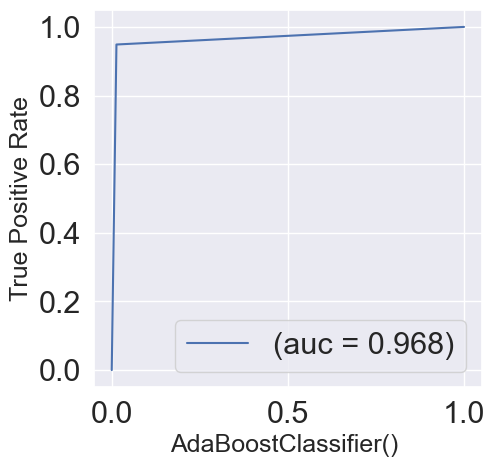

In [99]:
from sklearn.metrics import roc_curve,auc
rf_tpr,rf_fpr,threshold=roc_curve(y_test, y_pred)
rf_auc=auc(rf_tpr,rf_fpr)
print('rf_fpr Value  : ', rf_tpr)
print('rf_tpr Value  : ', rf_fpr)
print('thresholds Value  : ', threshold)

#Draw ROC Curve && AUC [Area Under The Curve]

plt.figure(figsize=(5,5), dpi=100)
plt.plot(rf_tpr, rf_fpr, linestyle='-', label='(auc = %0.3f)' % rf_auc)

plt.ylabel('True Positive Rate', fontsize = 18)
plt.xlabel('False Positive Rate', fontsize = 18)
plt.xlabel('AdaBoostClassifier() ', fontsize = 18)
plt.legend()
plt.show()

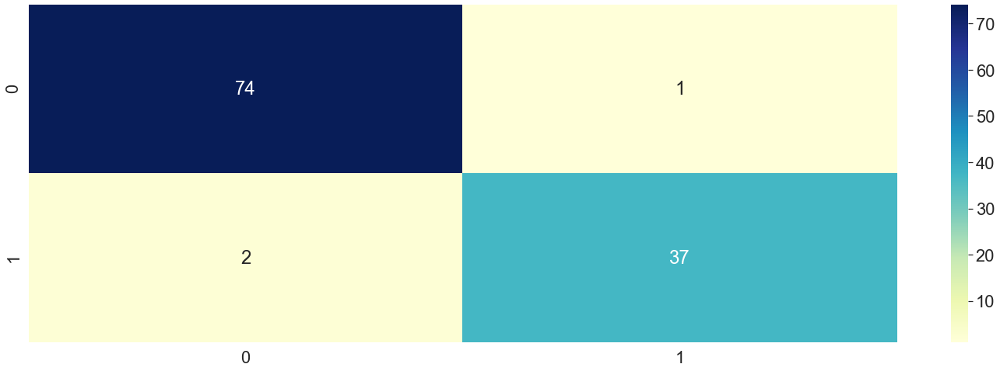

In [46]:
sns.heatmap(confusion_matrix(y_test,y_pred),cmap="YlGnBu", annot=True, fmt="d")

In [47]:
from sklearn.ensemble import GradientBoostingClassifier

lr_list= [0.05,0.075,0.1,0.25,0.5,0.75,1] #Learning Rate

for learning_rate in lr_list:
    clf= GradientBoostingClassifier(n_estimators=20, 
                                    learning_rate=learning_rate,max_features=2,max_depth=2,random_state=0)
    clf.fit(X_train,y_train)

    print("Learning Rate :", learning_rate)
    print(" Accuracy rate of training ", clf.score(X_train,y_train))
    print("Accuracy score of the test :", clf.score(X_test,y_test))

Learning Rate : 0.05
 Accuracy rate of training  0.945054945054945
Accuracy score of the test : 0.956140350877193
Learning Rate : 0.075
 Accuracy rate of training  0.9604395604395605
Accuracy score of the test : 0.956140350877193
Learning Rate : 0.1
 Accuracy rate of training  0.9714285714285714
Accuracy score of the test : 0.956140350877193
Learning Rate : 0.25
 Accuracy rate of training  0.9802197802197802
Accuracy score of the test : 0.9385964912280702
Learning Rate : 0.5
 Accuracy rate of training  0.9956043956043956
Accuracy score of the test : 0.9473684210526315
Learning Rate : 0.75
 Accuracy rate of training  1.0
Accuracy score of the test : 0.9473684210526315
Learning Rate : 1
 Accuracy rate of training  1.0
Accuracy score of the test : 0.9385964912280702


In [48]:
# En İyi Doğruluk oranı Öğrenme Oranında gözlemlenmiştir : 0.75
# Doğruluk oranı training: 1.0
# Doğruluk oranı test : 0.9415204678362573
clf_new= GradientBoostingClassifier(n_estimators=10,max_features=2,learning_rate=0.25,random_state=1)
clf_new.fit(X_test,y_test)
# Model üzerinde train doğrulanması
y_test_pred =clf_new.predict(X_test)
y_test_prob =clf_new.predict_proba(X_test)[:,1]

print("Accuracy Score of train", accuracy_score(y_test,y_test_pred))
print("Accuracy Score of test", accuracy_score(y_test,y_test_pred))


Accuracy Score of train 0.9912280701754386
Accuracy Score of test 0.9912280701754386


rf_fpr Value  :  [0. 0. 1.]
rf_tpr Value  :  [0.         0.97435897 1.        ]
thresholds Value  :  [2 1 0]


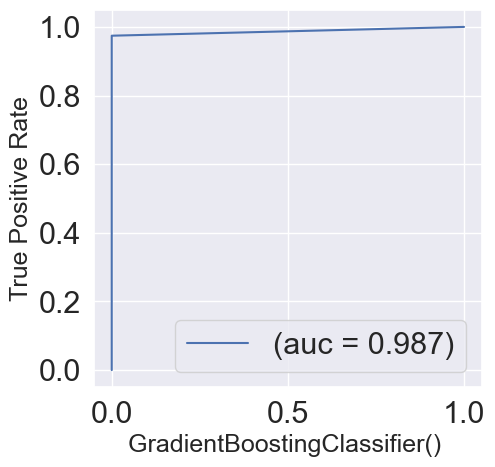

In [103]:
from sklearn.metrics import roc_curve,auc
rf_tpr,rf_fpr,threshold=roc_curve(y_test,y_test_pred)
rf_auc=auc(rf_tpr,rf_fpr)
print('rf_fpr Value  : ', rf_tpr)
print('rf_tpr Value  : ', rf_fpr)
print('thresholds Value  : ', threshold)

#Draw ROC Curve && AUC [Area Under The Curve]

plt.figure(figsize=(5,5), dpi=100)
plt.plot(rf_tpr, rf_fpr, linestyle='-', label='(auc = %0.3f)' % rf_auc)

plt.ylabel('True Positive Rate', fontsize = 18)
plt.xlabel('False Positive Rate', fontsize = 18)
plt.xlabel('GradientBoostingClassifier() ', fontsize = 18)
plt.legend()
plt.show()

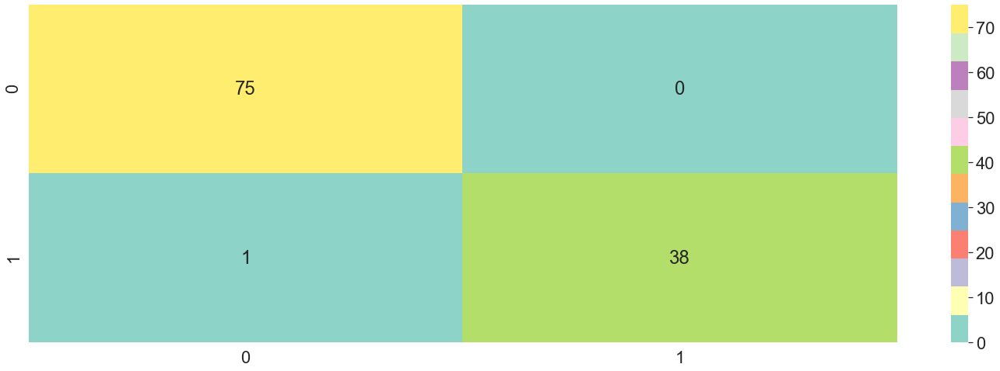

In [108]:
sns.heatmap(confusion_matrix(y_test,y_test_pred),annot=True,fmt='g',cmap='Set3')

In [50]:
from sklearn import model_selection
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [ ]:
seed = 7
# prepare models
models = []
models.append(('LogisticRegression', LogisticRegression()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('DecisionTreeClassifier', DecisionTreeClassifier()))
models.append(('NB', GaussianNB()))
models.append(('AdaBoostClassifier', AdaBoostClassifier()))
models.append(('ANN',xgboost.XGBClassifier()))
models.append(('MultiLayerPerceptron',MLPClassifier()))
models.append(('LDA', LDA()))
models.append(('GradientBoosting', GradientBoostingClassifier()))
#models.append(('ANN', Sequential()))
models.append(('RandomForest', RandomForestClassifier()))
models.append(('SVM Algorithm ', SVC()))
results = []
names = []
scoring = 'accuracy'
for name, model in models:
	kfold = model_selection.KFold(n_splits=10, random_state=seed)
	cv_results = model_selection.cross_val_score(model, X, y, cv=kfold, scoring=scoring)
	results.append(cv_results)
	names.append(name)
	msg = "%s: %f (%f)" % (name                                            
        , cv_results.mean(), cv_results.std())
	print(msg)
# boxplot ile algoritma karşılaştırması
fig = plt.figure(figsize=(40,20))
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
c = "#1342f2"
plt.boxplot(results, patch_artist=True,
            boxprops=dict(facecolor=c, color=c),
            capprops=dict(color=c),
            medianprops=dict(color=c),
            )
ax.set_xticklabels(names)

plt.show()

LogisticRegression: 0.936779 (0.036077)
KNN: 0.926253 (0.046232)
DecisionTreeClassifier: 0.934931 (0.028473)
NB: 0.936779 (0.036077)


In [39]:
#data1=data[data["diagnosis"]==1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=102) #0.20 4
lda = LDA()
lda.fit(X_train, y_train)
score = lda.score(X_test, y_test)
predections = lda.predict(X_test)
from sklearn.metrics import mean_squared_error
acc = mean_squared_error(y_test, predections)

print ('(İyi huylu veri için MSE): ', acc)
tahmin=(lda.predict([[13.54,14.36,87.46,566.3,0.09779,0.08129,0.06664,0.04781,0.1885,0.05766,0.2699,0.7886,2.058,23.56,0.008462,0.0146,0.02387,0.01315,0.0198,0.0023,15.11,19.26,99.7,711.2,0.144,0.1773,0.239,0.1288,0.2977,0.07259]]))
#tahminimiz = model.predict([[20.540]])
print( "Accuracy= ",(score))

(İyi huylu veri için MSE):  0.02631578947368421
Accuracy=  0.9736842105263158


In [40]:
#Gradient Descent (Hata oranını en aza indirmek için öğrenme oranını kullanma) %98 doğrulukla sağlanır.

In [74]:
#data1=data[data["diagnosis"]==1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=102) #0.20 4
nb = GaussianNB()
nb.fit(X_train, y_train)
score = nb.score(X_test, y_test)
y_pred = nb.predict(X_test)
from sklearn.metrics import mean_squared_error
acc = mean_squared_error(y_test, y_pred)

print ('(İyi huylu verisi icin MSE): ', acc)
tahmin=(nb.predict([[13.54,14.36,87.46,566.3,0.09779,0.08129,0.06664,0.04781,0.1885,0.05766,0.2699,0.7886,2.058,23.56,0.008462,0.0146,0.02387,0.01315,0.0198,0.0023,15.11,19.26,99.7,711.2,0.144,0.1773,0.239,0.1288,0.2977,0.07259]]))
#tahminimiz = model.predict([[20.540]])
print (''.format(accuracy_score),tahmin)
print( "Accuracy= ",(score))

(İyi huylu verisi icin MSE):  0.02631578947368421
 [0]
Accuracy=  0.9736842105263158


In [75]:
#data1=data[data["diagnosis"]==1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=102) #0.20 4
nb = GaussianNB()
nb.fit(X_train, y_train)
y_pred = nb.predict(X_test)
from sklearn.metrics import mean_squared_error
acc = mean_squared_error(y_test, y_pred)

print ('(Kötü huylu verisi icin MSE): ', acc)
tahmin=(nb.predict([[20.29,14.34,135.1,1297,0.1003,0.1328,0.198,0.1043,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.01149,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.2,1575,0.1374,0.205,0.4,0.1625,0.2364,0.07678]]))
#tahminimiz = model.predict([[20.540]])
print (''.format(accuracy_score),tahmin)

(Kötü huylu verisi icin MSE):  0.02631578947368421
 [1]


In [114]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=102) #0.20 4
clf_new= GradientBoostingClassifier(n_estimators=10,max_features=2,learning_rate=0.1,random_state=1)
clf_new.fit(X_train,y_train)
score = clf_new.score(X_test, y_test)
y_test_pred =clf_new.predict(X_test)
from sklearn.metrics import mean_squared_error
acc = mean_squared_error(y_test,y_test_pred)
print ('(Kötü huylu verisi icin MSE): ', acc)
tahmin=(clf_new.predict([[20.29,14.34,135.1,1297,0.1003,0.1328,0.198,0.1043,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.01149,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.2,1575,0.1374,0.205,0.4,0.1625,0.2364,0.07678]]))
#tahminimiz = model.predict([[20.540]])
print (''.format(accuracy_score),tahmin)
print( "Accuracy= ",(score))

(Kötü huylu verisi icin MSE):  0.02631578947368421
 [1]
Accuracy=  0.9736842105263158


In [116]:
#data1=data[data["diagnosis"]==1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=102) #0.20 4
model = MLPClassifier(hidden_layer_sizes = (200, 200), max_iter = 200)
model.fit(X_train, y_train)
score = model.score(X_test, y_test)
y_pred = model.predict(X_test)
from sklearn.metrics import mean_squared_error
acc = mean_squared_error(y_test,y_pred)

print ('(Kötü huylu verisi icin MSE): ', acc)
tahmin=(clf_new.predict([[13.54,14.36,87.46,566.3,0.09779,0.08129,0.06664,0.04781,0.1885,0.05766,0.2699,0.7886,2.058,23.56,0.008462,0.0146,0.02387,0.01315,0.0198,0.0023,15.11,19.26,99.7,711.2,0.144,0.1773,0.239,0.1288,0.2977,0.07259]]))
#tahminimiz = model.predict([[20.540]])
print (''.format(accuracy_score),tahmin)
print( "Accuracy= ",(score))

(Kötü huylu verisi icin MSE):  0.14035087719298245
 [0]
Accuracy=  0.8596491228070176


In [76]:
#data1=data[data["diagnosis"]==1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=102) #0.20 4
rf=RandomForestClassifier(criterion = 'entropy',random_state=42,max_depth=2)
#modeli eğit
rf.fit(X_train,y_train)
score = rf.score(X_test, y_test)
#Tahmin yazdır Test&Train
y_pred_rf=rf.predict(X_test)
from sklearn.metrics import mean_squared_error
acc = mean_squared_error(y_test,y_pred_rf)
print ('(Kötü huylu verisi icin MSE): ', acc)
tahmin=(clf_new.predict([[19.81,22.15,130,1260,0.09831,0.1027,0.1479,0.09498,0.1582,0.05395,0.7582,1.017,5.865,112.4,0.006494,0.01893,0.03391,0.01521,0.01356,0.001997,27.32,30.88,186.8,2398,0.1512,0.315,0.5372,0.2388,0.2768,0.07615]]))
#tahminimiz = model.predict([[20.540]])
print (''.format(accuracy_score),tahmin)
print( "Accuracy= ",(score))

(Kötü huylu verisi icin MSE):  0.02631578947368421
 [1]
Accuracy=  0.9736842105263158


In [59]:
data1=data[data["diagnosis"]==1]
data1=data[data["radius_mean"]<=13.540]
data1=data1.drop(["texture_mean"],axis=1)
data1=data1.drop(["perimeter_mean"],axis=1)
data1=data1.drop(["area_mean"], axis=1)
data1=data1.drop(['concave points_mean'], axis=1)
data1=data1.drop(['symmetry_mean'], axis=1)
data1=data1.drop(['fractal_dimension_mean'], axis=1)
m=len(data)
X=np.reshape(np.asarray(data["radius_mean"]),(m,-1))
Y=np.reshape(np.asarray(data["diagnosis"]),(m,-1))

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=100)

model = LogisticRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
from sklearn.metrics import mean_squared_error
acc = mean_squared_error(y_test, y_pred)
print ('Skoru (Sadece kötü huylu verisi icin): ', acc)
tahminimiz = model.predict([[20.540]])
print (''.format(accuracy_score),tahminimiz)
#0=hasta değildir.
#1=hasta
# print('Lojistik Regression accuracy_score: {}  %'.format(accuracy_score*100),tahminimiz)
# #print('auc: {}  %'.format(auc*100))

Skoru (Sadece kötü huylu verisi icin):  0.09649122807017543
 [1]


In [61]:
data1=data[data["diagnosis"]==1]
data1
data1=data[data["radius_mean"]<=13.540]
data1=data1.drop(["texture_mean"],axis=1)
data1=data1.drop(["perimeter_mean"],axis=1)
data1=data1.drop(["area_mean"], axis=1)
# data1=data1.drop(["smoothness_mean"], axis=1)
# data1=data1.drop(['compactness_mean'], axis=1)
# data1=data1.drop(['concavity_mean'], axis=1)
data1=data1.drop(['concave points_mean'], axis=1)
data1=data1.drop(['symmetry_mean'], axis=1)
data1=data1.drop(['fractal_dimension_mean'], axis=1)

# data=data.drop(['radius_se'], axis=1)
# data=data.drop(['texture_se'], axis=1)
# data=data.drop(['perimeter_se'], axis=1)
# data=data[data["area_se"]==1]
# data=data[data["smoothness_se"]>=300]
# data=data.drop(["compactness_se"], axis=1)
# data=data.drop(["concavity_se"], axis=1)
# data=data.drop(["concave points_se"], axis=1)
# data=data.drop(['symmetry_se'], axis=1)
# data=data.drop(['fractal_dimension_se'], axis=1)

# data=data.drop(['radius_worst'], axis=1)
# data=data.drop(['texture_worst'], axis=1)
# data=data.drop(['perimeter_worst'], axis=1)
# data=data[data["area_worst"]==1]
# data=data[data["smoothness_worst"]>=300]
# data=data.drop(["compactness_worst"], axis=1)
# data=data.drop(["concavity_worst"], axis=1)
# data=data.drop(["concave points_worst"], axis=1)
# data=data.drop(['symmetry_worst'], axis=1)
# data=data.drop(['fractal_dimension_worst'], axis=1)

m=len(data)
X=np.reshape(np.asarray(data["texture_mean"]),(m,-1))
Y=np.reshape(np.asarray(data["diagnosis"]),(m,-1))

#Kolesterolu 350 olan erkek bireyin hasta olup olmaması
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=100)

model = LogisticRegression()

# 5. modelimizi egitelim
model.fit(X_train, y_train)

# 6. modeli test edelim
y_pred = model.predict(X_test)

# 7. modelin basarisini olcelim
from sklearn.metrics import mean_squared_error

acc = mean_squared_error(y_test, y_pred)

print ('Skoru (Sadece kötü huylu verisi icin): ', acc)

tahminimiz = model.predict([[23.04]])
print (''.format(accuracy_score),tahminimiz)
#0=hasta değildir.
#1=hasta
# print('Lojistik Regression accuracy_score: {}  %'.format(accuracy_score*100),tahminimiz)
# #print('auc: {}  %'.format(auc*100))

Skoru (Sadece kötü huylu verisi icin):  0.3333333333333333
 [1]
